In [235]:
import numpy as np
import pandas as pd

In [236]:
df = pd.read_csv('https://raw.githubusercontent.com/Himanshu-1703/reddit-sentiment-analysis/refs/heads/main/data/reddit.csv')
df.head()

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1


In [237]:
df.shape

(37249, 2)

In [238]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37249 entries, 0 to 37248
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  37149 non-null  object
 1   category       37249 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 582.1+ KB


In [239]:
df['category'] = df['category'].astype('category')

In [240]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37249 entries, 0 to 37248
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   clean_comment  37149 non-null  object  
 1   category       37249 non-null  category
dtypes: category(1), object(1)
memory usage: 327.6+ KB


In [241]:
df.isnull().sum()

clean_comment    100
category           0
dtype: int64

In [242]:
df.dropna(inplace=True)

In [243]:
df.duplicated().sum()

np.int64(350)

In [244]:
df.drop_duplicates(inplace=True)

In [245]:
df.duplicated().sum()

np.int64(0)

In [246]:
df[df['clean_comment'].isna()]

,clean_comment,category


In [247]:
df.shape

(36799, 2)

In [248]:
df = df[~(df['clean_comment'].str.strip() == '')]

In [249]:
# lower case
def lower_case(text):
    return text.lower()

# strip text
def strip_text(text):
    return text.strip()

df['clean_comment'] = df['clean_comment'].apply(lower_case)
df['clean_comment'] = df['clean_comment'].apply(strip_text)

In [250]:
df.sample()['clean_comment'].values

array(['don really think means just talking out his ass that what politics all about every one talks shit and hopes the people fall for and make them power not feel that has the best interest the nation heart action speaks louder than words'],
      dtype=object)

In [251]:
url_pattern = r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'
df['clean_comment'].str.contains(url_pattern, regex=True).sum()

np.int64(0)

In [252]:
df['clean_comment'].str.contains('/n').sum()

np.int64(0)

### EDA

In [253]:
import seaborn as sns
import matplotlib.pyplot as plt

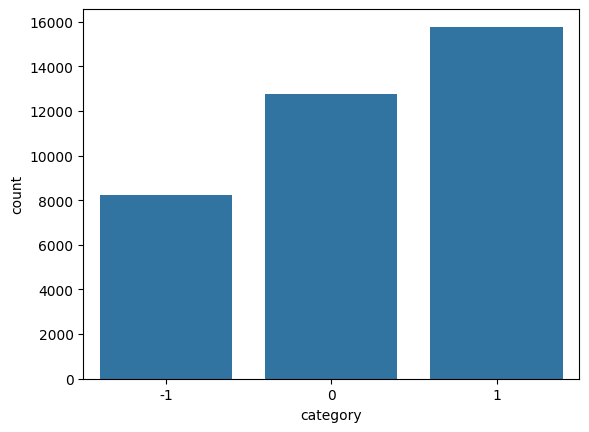

In [254]:
sns.countplot(data=df, x='category')
plt.show()

In [255]:
df['category'].value_counts(normalize=True).mul(100).round(2)

category
 1    42.86
 0    34.71
-1    22.42
Name: proportion, dtype: float64

In [256]:
df['word_count'] = df['clean_comment'].apply(lambda x: len(x.split()))

In [257]:
df.sample(5)

,clean_comment,category,word_count
27887,another attack,0,2
36820,this will translate direct victory for smriti ...,1,92
34715,two men from another group came motorcycle and...,-1,78
35771,the dog was there modi just wagged the questio...,-1,23
25963,dark and difficult times lie ahead,-1,6


In [258]:
df['word_count'].describe()

count    36793.000000
mean        29.667464
std         56.790738
min          1.000000
25%          6.000000
50%         13.000000
75%         30.000000
max       1307.000000
Name: word_count, dtype: float64

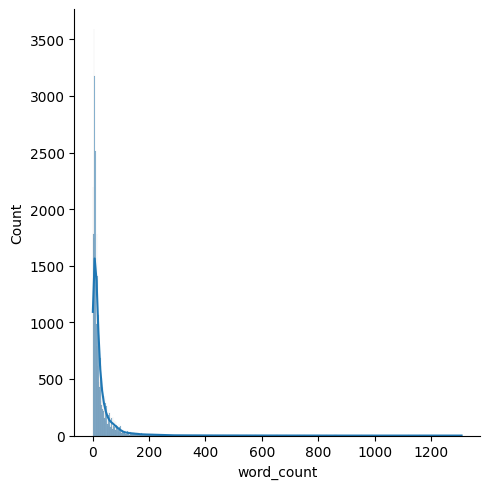

In [259]:
sns.displot(df['word_count'], kde=True)
plt.show()

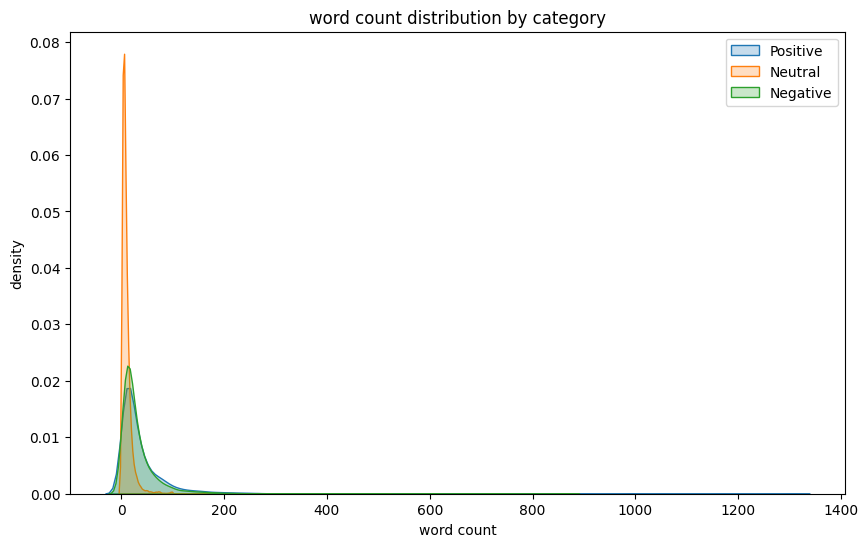

In [260]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df[df['category']==1]['word_count'], label='Positive', fill=True)
sns.kdeplot(df[df['category']==0]['word_count'], label='Neutral', fill=True)
sns.kdeplot(df[df['category']==-1]['word_count'], label='Negative', fill=True)
plt.title("word count distribution by category")
plt.xlabel("word count")
plt.ylabel("density")
plt.legend()
plt.show()

**Positive comments (cat. 1) ->** these comments tends to have a wider spread in word count, indicating that longer comments are more common for positive comments.

**Negative comments (cat. -1) ->** this distribution is approx similar to positive one. the only differece seems to be a little bit spiker than positive, indicates, small comments more common than positive one.

**Neutral comments (cat. 0) ->** this graph shows concentration of neutral comments towords shorter length.

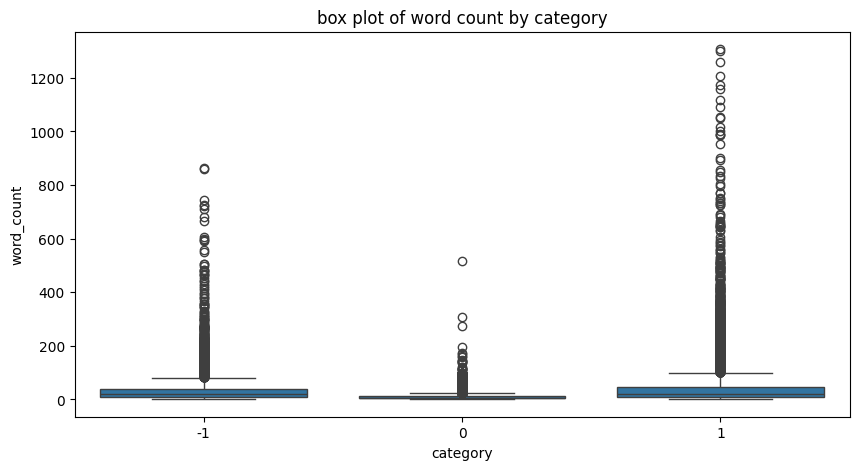

In [261]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x='category', y='word_count')
plt.title("box plot of word count by category")
plt.show()

**Negative comments (cat. -1) ->** the median of word count is low, indicating that most comments are small in this category. the IQR range is narrow suggesting low variability. several outliers with high word count is present here.

**Neutral comments (cat. 0) ->** the median seems to be slightly heigher compared to -1, but still relatively low. IQR is showing low variability. this category also has outliers, though they are less extreme than in other categories.

**Positive comments (cat. 1) ->** the median is similar to that of cat -1, showing a low central tendency. the IQR is slightly wider than the other categories, indicating more variability. many high outliers are present, with a large range.

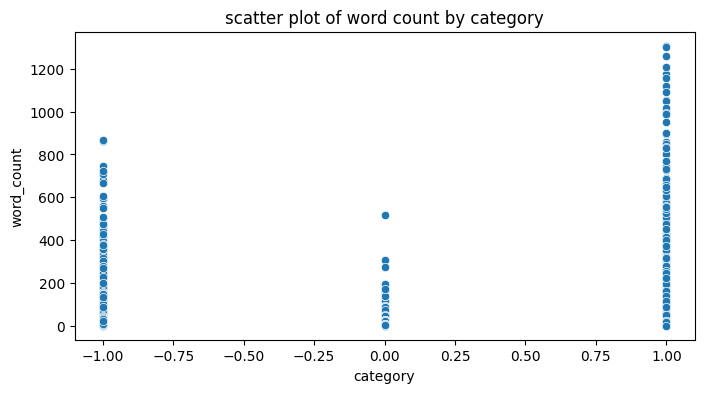

In [262]:
plt.figure(figsize=(8,4))
sns.scatterplot(data=df, x='category', y='word_count')
plt.title("scatter plot of word count by category")
plt.show()

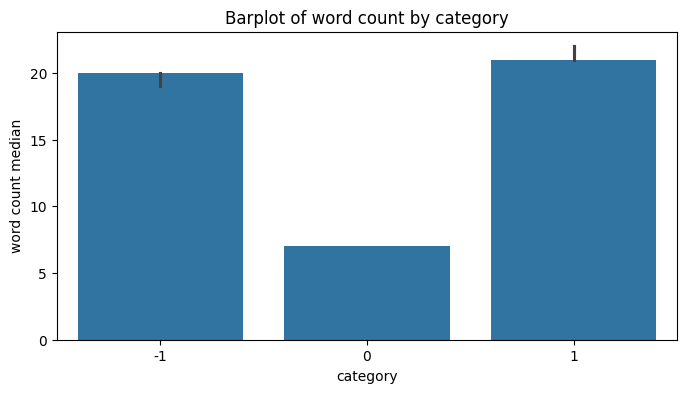

In [263]:
plt.figure(figsize=(8,4))
sns.barplot(data=df, x='category', y='word_count', estimator='median')
plt.title("Barplot of word count by category")
plt.xlabel('category')
plt.ylabel('word count median')
plt.show()

In [264]:
!pip install nltk


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [265]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

stopwords = set(stopwords.words('english'))

def no_of_stopwords(text):
    return len([word for word in text.split() if word in stopwords])

df['no_of_stopwords'] = df['clean_comment'].apply(no_of_stopwords)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Appsquadz\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<Axes: xlabel='no_of_stopwords', ylabel='Count'>

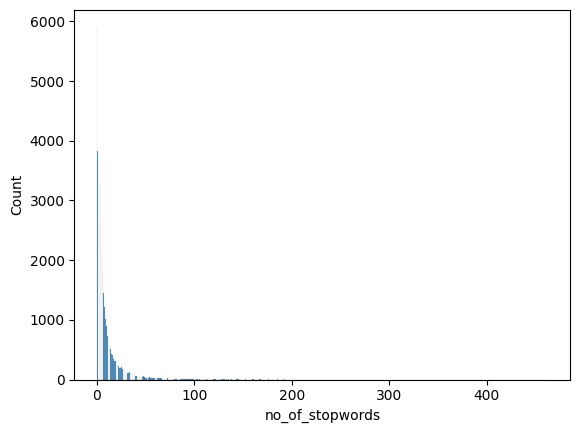

In [266]:
sns.histplot(data=df, x='no_of_stopwords')

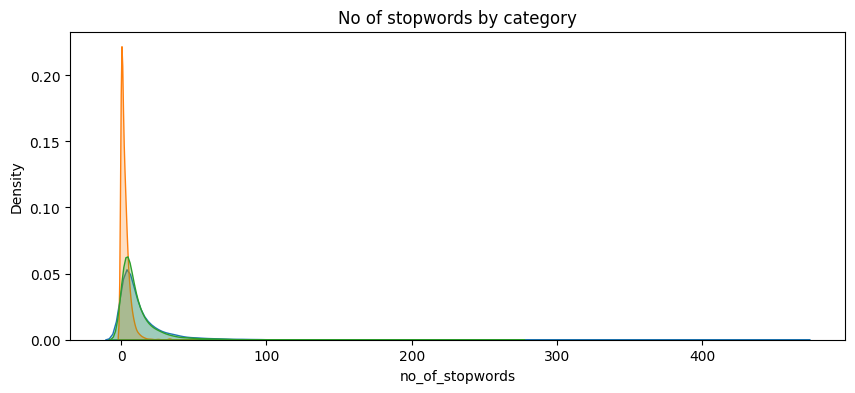

In [267]:
plt.figure(figsize=(10,4))
sns.kdeplot(data=df[df['category']==1]['no_of_stopwords'], label='Positive', fill=True)
sns.kdeplot(data=df[df['category']==0]['no_of_stopwords'], label='Neutral', fill=True)
sns.kdeplot(data=df[df['category']==-1]['no_of_stopwords'], label='Negative', fill=True)
plt.title("No of stopwords by category")
plt.show()

C:\Users\Appsquadz\AppData\Local\Temp\ipykernel_7776\573627203.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=stopwords_df, x='freq', y='word', palette='viridis')


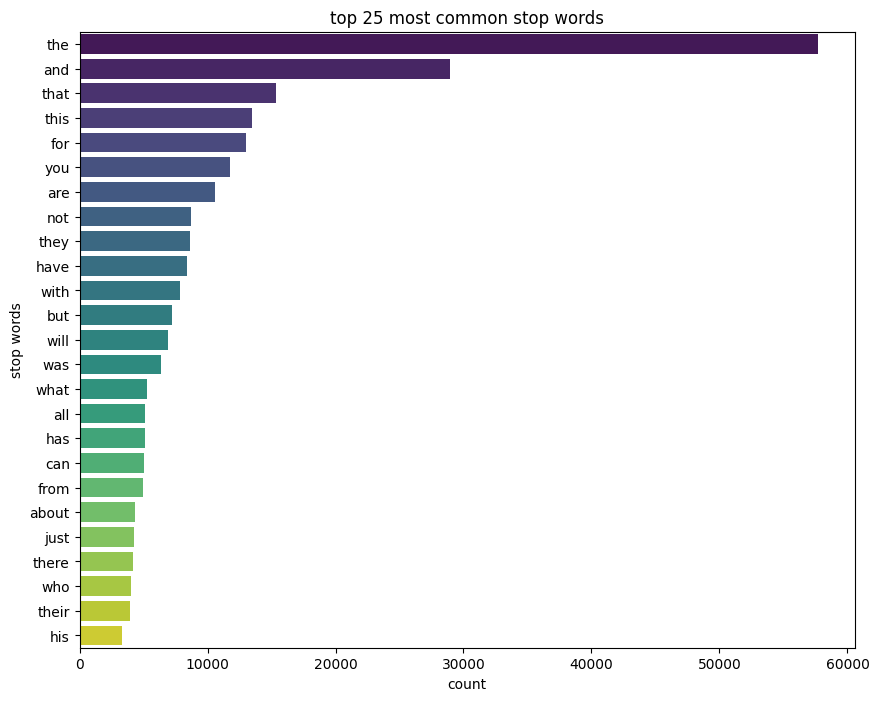

In [268]:
# extract 25 most common stopwords
from collections import Counter

all_stopwords = [word for comment in df['clean_comment'] for word in comment.split() if word in stopwords]
top_25_stopwords = Counter(all_stopwords).most_common(25)
stopwords_df = pd.DataFrame(top_25_stopwords, columns=['word', 'freq'])

plt.figure(figsize=(10,8))
sns.barplot(data=stopwords_df, x='freq', y='word', palette='viridis')
plt.title("top 25 most common stop words")
plt.xlabel("count")
plt.ylabel("stop words")
plt.show()

In [269]:
# find frequency of most common letters
all_letters = " ".join(df['clean_comment'])
letters_count = Counter(all_letters)
letters_count = pd.DataFrame(letters_count.items(), columns=["letter", "freq"])
letters_count.sort_values(by='freq', ascending=False).tail(50)

,letter,freq
1292,鞋,1
1293,峰,1
1326,才,1
1327,叫,1
1328,醒,1
1329,妖,1
1330,婆,1
1300,角,1
1301,衰,1
1304,技,1


In [270]:
# find no of puncuation marks in comments
df['no_of_puncuation_mark'] = df['clean_comment'].apply(lambda x: sum([1 for letter in x if letter in ".,!?;:\"\'()[]\{\}-"]))

<>:2: SyntaxWarning: invalid escape sequence '\{'
<>:2: SyntaxWarning: invalid escape sequence '\{'
C:\Users\Appsquadz\AppData\Local\Temp\ipykernel_7776\574800550.py:2: SyntaxWarning: invalid escape sequence '\{'
  df['no_of_puncuation_mark'] = df['clean_comment'].apply(lambda x: sum([1 for letter in x if letter in ".,!?;:\"\'()[]\{\}-"]))


In [271]:
df[df['no_of_puncuation_mark'] > 0]

,clean_comment,category,word_count,no_of_stopwords,no_of_puncuation_mark
484,183\tkazari uiharu\traildex 177\truiko saten\t...,1,20,3,1
1497,hahah post whining about how aap posts are get...,1,32,8,1
2171,\ harsh vardhan bedi for candidate then,-1,7,2,1
2172,\ modi becomes,0,3,0,1
2397,this thread has been linked from elsewhere red...,1,79,27,2
...,...,...,...,...,...
36854,holy shit read sunny leone instead sunny deol \,-1,9,0,1
36937,hat say about our nri brothers all those who l...,1,194,54,13
36946,\ and hamare desh right wing kaise chutiya ban...,1,112,8,5
36959,\ grins saffron,0,3,0,1


In [272]:
words = nltk.word_tokenize(" ".join(df['clean_comment']))
Counter(list(nltk.bigrams(words))).most_common(25)

[(('the', 'same'), 2439),
 (('for', 'the'), 1782),
 (('and', 'the'), 1709),
 (('that', 'the'), 1400),
 (('they', 'are'), 1358),
 (('with', 'the'), 1198),
 (('all', 'the'), 986),
 (('from', 'the'), 929),
 (('you', 'are'), 904),
 (('has', 'been'), 896),
 (('you', 'can'), 836),
 (('the', 'best'), 812),
 (('have', 'been'), 781),
 (('the', 'bjp'), 759),
 (('you', 'have'), 754),
 (('the', 'country'), 686),
 (('the', 'team'), 684),
 (('there', 'are'), 676),
 (('are', 'not'), 665),
 (('the', 'free'), 653),
 (('about', 'the'), 652),
 (('the', 'government'), 649),
 (('free', 'encyclopedia'), 623),
 (('encyclopedia', 'the'), 606),
 (('they', 'have'), 604)]

In [273]:
# extract 25 most common bigrams
from sklearn.feature_extraction.text import CountVectorizer

def most_common_trigrams_from_series(series, top_n=25):    
    text_data = series.str.cat(sep=" ")

    vectorizer = CountVectorizer(ngram_range=(3,3))
    trigram_matrix = vectorizer.fit_transform([text_data])

    trigram_counts = trigram_matrix.sum(axis=0).A1
    trigram_names = vectorizer.get_feature_names_out()

    trigram_df = pd.DataFrame({"trigram":trigram_names, "count":trigram_counts})
    top_trigrams = trigram_df.sort_values(by='count', ascending=False).head(top_n)

    return top_trigrams

def most_common_bigrams_from_series(series, top_n=25):
    # Combine all the text in the series into a single string
    text_data = series.str.cat(sep=' ')
    
    # Initialize CountVectorizer with bigrams
    vectorizer = CountVectorizer(ngram_range=(2, 2))
    
    # Fit and transform the text data
    bigram_matrix = vectorizer.fit_transform([text_data])
    
    # Sum the occurrences of each bigram
    bigram_counts = bigram_matrix.sum(axis=0).A1
    bigram_names = vectorizer.get_feature_names_out()
    
    # Create a DataFrame for easy sorting
    bigram_df = pd.DataFrame({'bigram': bigram_names, 'count': bigram_counts})
    
    # Sort by count and retrieve the top N bigrams
    top_bigrams = bigram_df.sort_values(by='count', ascending=False).head(top_n)
    
    return top_bigrams

top_25_bigram = most_common_bigrams_from_series(df['clean_comment'])
top_25_trigram = most_common_trigrams_from_series(df['clean_comment'])
top_25_bigram

,bigram,count
468964,the same,2439
175133,for the,1783
32477,and the,1709
461664,that the,1411
477098,they are,1359
535033,with the,1199
20399,all the,987
180711,from the,929
544460,you are,904
206656,has been,896


C:\Users\Appsquadz\AppData\Local\Temp\ipykernel_7776\3428036239.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_bigrams, x='count', y='bigram', palette='viridis')


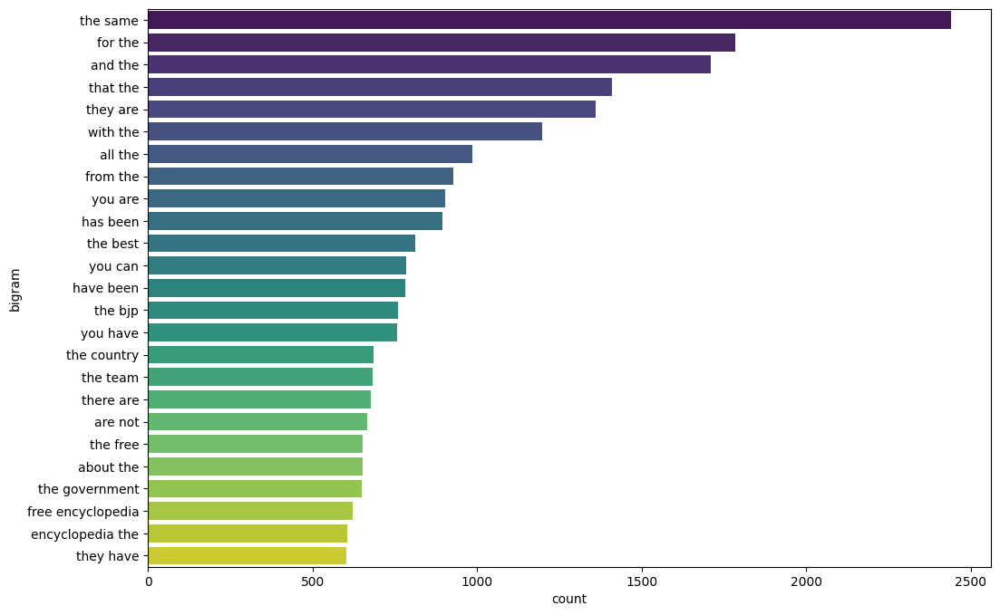

In [274]:
top_bigrams = pd.DataFrame(top_25_bigram)

plt.figure(figsize=(12, 8))
sns.barplot(data=top_bigrams, x='count', y='bigram', palette='viridis')
plt.show()

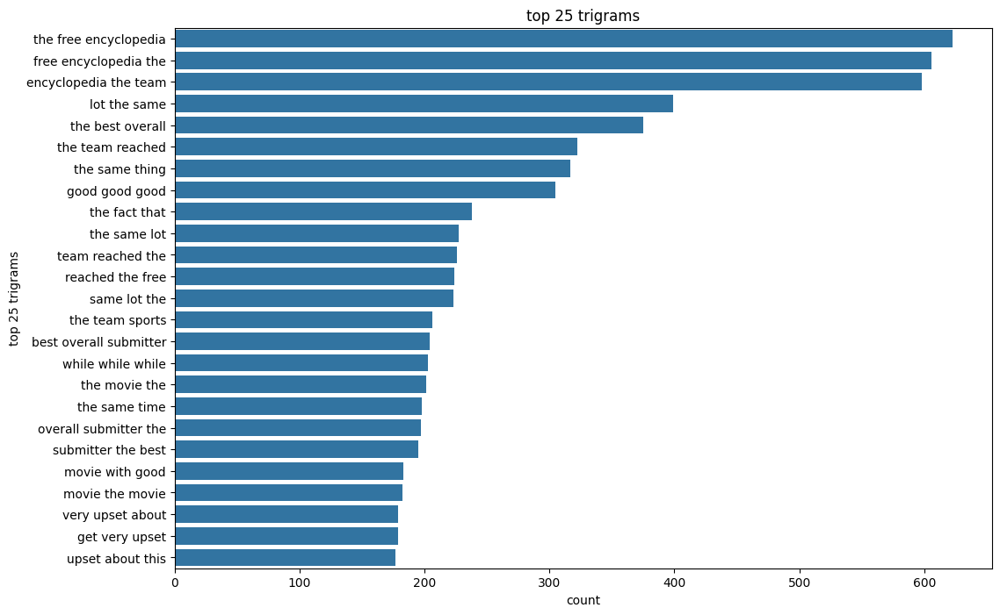

In [275]:
trigram_df = pd.DataFrame(top_25_trigram)
plt.figure(figsize=(12, 8))
sns.barplot(data=trigram_df, x='count', y='trigram')
plt.title("top 25 trigrams")
plt.xlabel("count")
plt.ylabel("top 25 trigrams")
plt.show()

In [276]:
# remove stopwords
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english')) - {'not', 'but', 'however', 'no', 'yet'}
df['clean_comment'] = df['clean_comment'].apply(lambda x: " ".join([word for word in x.split() if word not in stop_words]))

In [277]:
df.head()

,clean_comment,category,word_count,no_of_stopwords,no_of_puncuation_mark
0,family mormon never tried explain still stare ...,1,39,13,0
1,buddhism much lot compatible christianity espe...,1,196,59,0
2,seriously say thing first get complex explain ...,-1,86,40,0
3,learned want teach different focus goal not wr...,0,29,15,0
4,benefit may want read living buddha living chr...,1,112,45,0


In [278]:
# apply lemmatization
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
df['clean_comment'] = df['clean_comment'].apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))

In [279]:
!pip install wordcloud


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


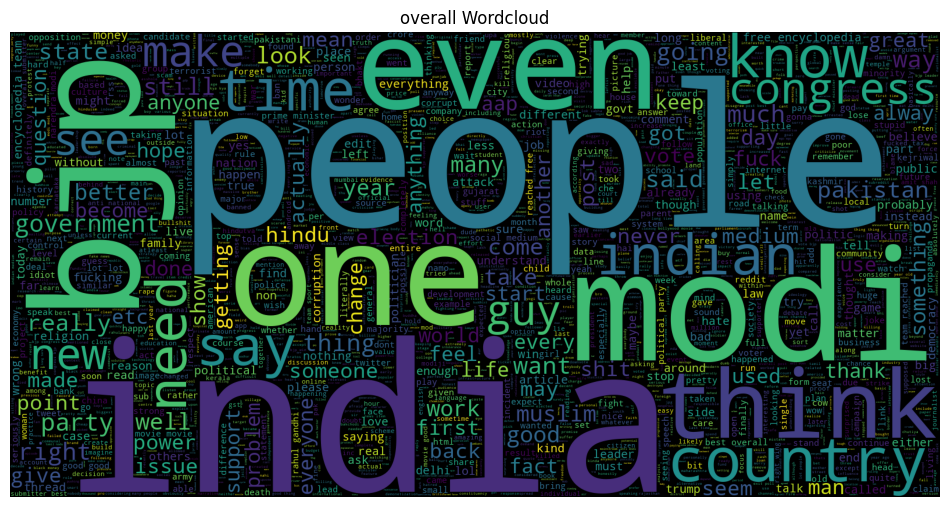

In [280]:
from wordcloud import WordCloud

cloud = WordCloud(width=1600, height=800, max_words=2000)
cloud.generate(" ".join(df['clean_comment']))
plt.figure(figsize=(12,8))
plt.imshow(cloud)
plt.title("overall Wordcloud")
plt.axis("off")
plt.show()

In [281]:
from wordcloud import WordCloud

def generate_cloud(text, words=2000):
    cloud = WordCloud(width=1600, height=800, max_words=words)
    cloud.generate(text)

    plt.figure(figsize=(12, 8))
    plt.imshow(cloud)
    plt.axis('off')
    plt.show()

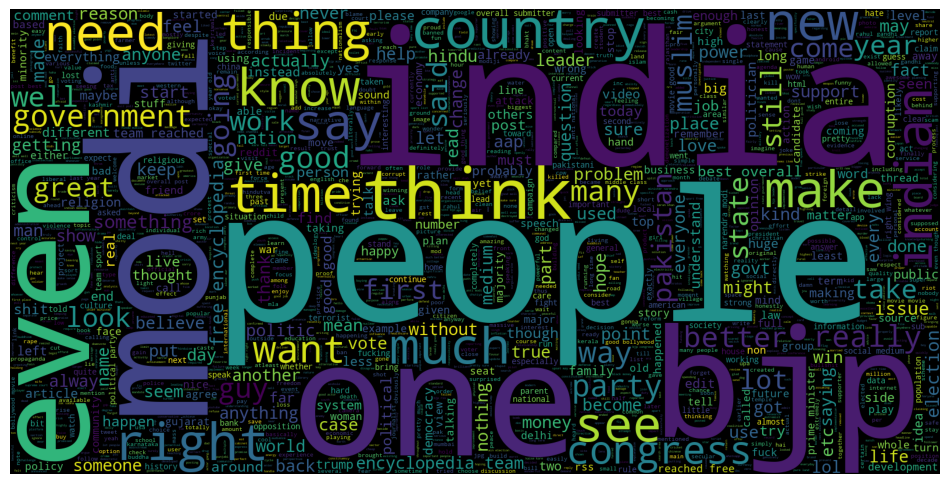

In [282]:
# Positive cloud
generate_cloud(" ".join(df[df['category']==1]['clean_comment']))

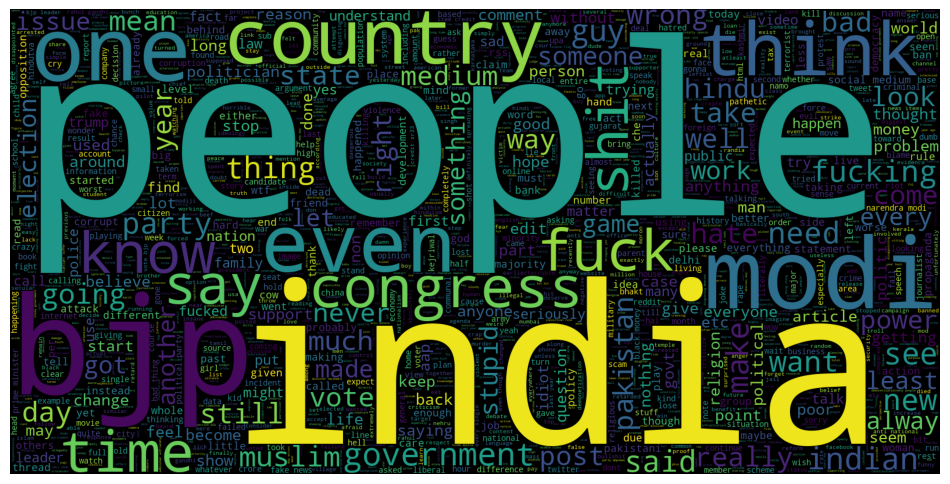

In [283]:
# Negative cloud
generate_cloud(" ".join(df[df['category']==-1]['clean_comment']))

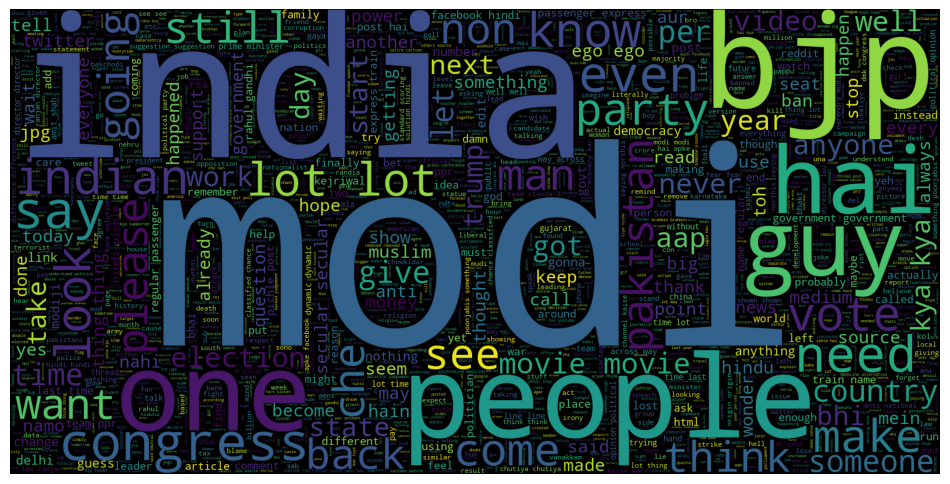

In [284]:
# Neutral cloud
generate_cloud(" ".join(df[df['category']==0]['clean_comment']))

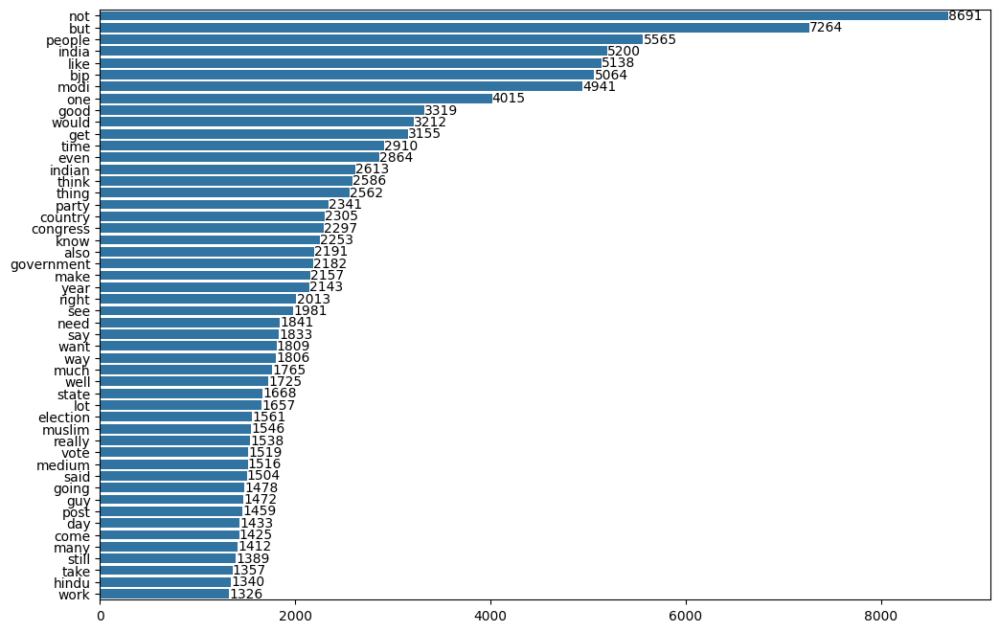

In [285]:
from collections import Counter

def plot_top_n_most_common_words(text, top_n=25):
    text = text.str.cat(sep=" ")
    counter = Counter(text.split())
    top_n_words = counter.most_common(top_n)
    
    words, count = zip(*top_n_words)

    plt.figure(figsize=(12,8))
    for index, value in enumerate(count):
        plt.text(value + 0.5, index, str(value), va='center')
    sns.barplot(x=list(count), y=list(words))
    plt.show()

plot_top_n_most_common_words(df['clean_comment'], 50)

In [292]:
for idx, row in df.iterrows():
    print(idx, row)

0 clean_comment            family mormon never tried explain still stare ...
category                                                                 1
word_count                                                              39
no_of_stopwords                                                         13
no_of_puncuation_mark                                                    0
Name: 0, dtype: object
1 clean_comment            buddhism much lot compatible christianity espe...
category                                                                 1
word_count                                                             196
no_of_stopwords                                                         59
no_of_puncuation_mark                                                    0
Name: 1, dtype: object
2 clean_comment            seriously say thing first get complex explain ...
category                                                                -1
word_count                                      

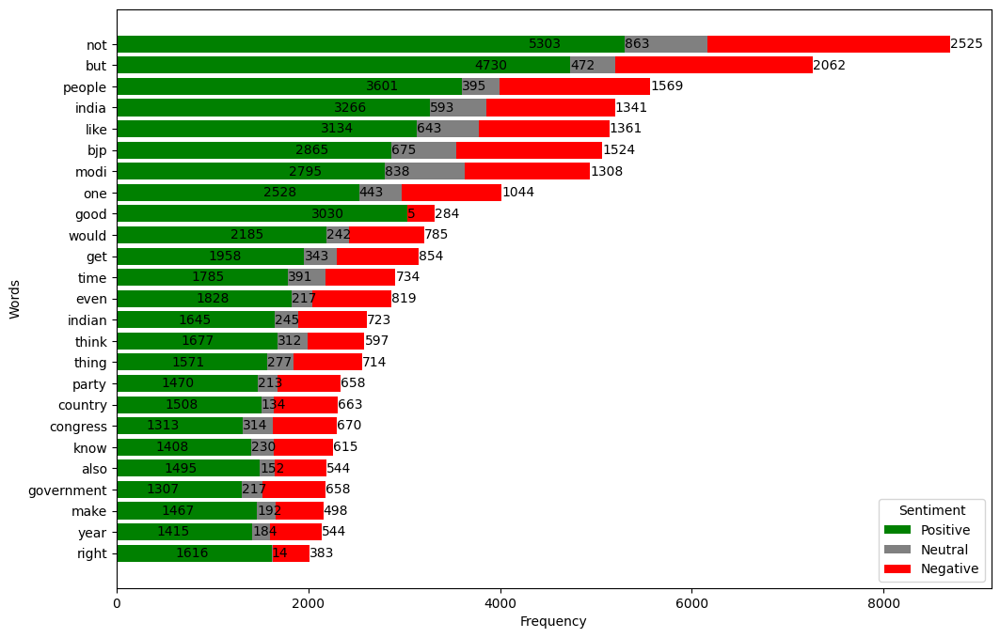

In [353]:
words_with_category_count = {}
def plot_top_n_words_by_category(df, top_n, start=0):

    for idx, row in df.iterrows():
        words = row['clean_comment'].split()
        category = row['category']
        
        for word in words:
            if word not in words_with_category_count:
                words_with_category_count[word] = {-1:0, 0:0, 1:0}
            words_with_category_count[word][category] += 1
    
    total_words_with_count = {word: sum(counts.values()) for word, counts in words_with_category_count.items()}
    most_common_words = sorted(total_words_with_count.items(), key=lambda x:x[1], reverse=True)[start:start+top_n]
    top_words = [word for word, _ in most_common_words]

    # prepare data for plotting
    words = top_words
    positive_counts = [words_with_category_count[word][1] for word in words]
    neutral_counts = [words_with_category_count[word][0] for word in words]
    negative_counts = [words_with_category_count[word][-1] for word in words]
    
    plt.figure(figsize=(12, 8))
    plt.barh(y=words, width=positive_counts, color='green', label='Positive')
    plt.barh(y=words, width=neutral_counts, left=positive_counts, color='gray', label='Neutral')
    plt.barh(y=words, width=negative_counts, left=[i+j for i, j in zip(positive_counts, neutral_counts)], color='red', label='Negative')
    for index, value in enumerate(positive_counts):
        plt.text(value - 1000, index, str(value), va='center')
        plt.text(value, index, str(neutral_counts[index]), va='center')
        plt.text((value+neutral_counts[index]+negative_counts[index]), index, str(negative_counts[index]), va='center')
    plt.legend(title='Sentiment')
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

plot_top_n_words_by_category(df, 25)

In [320]:
[word for word, _ in sorted({word: sum(counts.values()) for word, counts in words_with_category_count.items()}.items(), key=lambda x: x[1], reverse=True)]

['not',
 'but',
 'people',
 'india',
 'like',
 'bjp',
 'modi',
 'one',
 'good',
 'would',
 'get',
 'time',
 'even',
 'indian',
 'think',
 'thing',
 'party',
 'country',
 'congress',
 'know',
 'also',
 'government',
 'make',
 'year',
 'right',
 'see',
 'need',
 'say',
 'want',
 'way',
 'much',
 'well',
 'state',
 'lot',
 'election',
 'muslim',
 'really',
 'vote',
 'medium',
 'said',
 'going',
 'guy',
 'post',
 'day',
 'come',
 'many',
 'still',
 'take',
 'hindu',
 'work',
 'pakistan',
 'look',
 'team',
 'better',
 'new',
 'news',
 'every',
 'best',
 'power',
 'back',
 'something',
 'first',
 'free',
 'could',
 'never',
 'give',
 'shit',
 'political',
 'let',
 'money',
 'world',
 'issue',
 'someone',
 'question',
 'man',
 'point',
 'leader',
 'made',
 'fuck',
 'minister',
 'hai',
 'got',
 'anti',
 'aap',
 'mean',
 'may',
 'last',
 'great',
 'done',
 'support',
 'feel',
 'actually',
 'bad',
 'anything',
 'long',
 'please',
 'etc',
 'hope',
 'movie',
 'anyone',
 'another',
 'show',
 'life'